Heart Attack Risk & Prediction – India

In [1]:
# Importing necessary libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder, MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, auc, roc_curve
from sklearn.metrics import mean_squared_error, root_mean_squared_error, r2_score
from sklearn.ensemble import RandomForestClassifier
import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv(r"heart_attack_prediction_india.csv")

In [3]:
df.head()

,Patient_ID,State_Name,Age,Gender,Diabetes,Hypertension,Obesity,Smoking,Alcohol_Consumption,Physical_Activity,...,Diastolic_BP,Air_Pollution_Exposure,Family_History,Stress_Level,Healthcare_Access,Heart_Attack_History,Emergency_Response_Time,Annual_Income,Health_Insurance,Heart_Attack_Risk
0,1,Rajasthan,42,Female,0,0,1,1,0,0,...,119,1,0,4,0,0,157,611025,0,0
1,2,Himachal Pradesh,26,Male,0,0,0,0,1,1,...,115,0,0,7,0,0,331,174527,0,0
2,3,Assam,78,Male,0,0,1,0,0,1,...,117,0,1,10,1,0,186,1760112,1,0
3,4,Odisha,58,Male,1,0,1,0,0,1,...,65,0,0,1,1,1,324,1398213,0,0
4,5,Karnataka,22,Male,0,0,0,0,0,1,...,109,0,0,9,0,0,209,97987,0,1


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Patient_ID               10000 non-null  int64 
 1   State_Name               10000 non-null  object
 2   Age                      10000 non-null  int64 
 3   Gender                   10000 non-null  object
 4   Diabetes                 10000 non-null  int64 
 5   Hypertension             10000 non-null  int64 
 6   Obesity                  10000 non-null  int64 
 7   Smoking                  10000 non-null  int64 
 8   Alcohol_Consumption      10000 non-null  int64 
 9   Physical_Activity        10000 non-null  int64 
 10  Diet_Score               10000 non-null  int64 
 11  Cholesterol_Level        10000 non-null  int64 
 12  Triglyceride_Level       10000 non-null  int64 
 13  LDL_Level                10000 non-null  int64 
 14  HDL_Level                10000 non-null

In [5]:
df.isna().sum()

Patient_ID                 0
State_Name                 0
Age                        0
Gender                     0
Diabetes                   0
Hypertension               0
Obesity                    0
Smoking                    0
Alcohol_Consumption        0
Physical_Activity          0
Diet_Score                 0
Cholesterol_Level          0
Triglyceride_Level         0
LDL_Level                  0
HDL_Level                  0
Systolic_BP                0
Diastolic_BP               0
Air_Pollution_Exposure     0
Family_History             0
Stress_Level               0
Healthcare_Access          0
Heart_Attack_History       0
Emergency_Response_Time    0
Annual_Income              0
Health_Insurance           0
Heart_Attack_Risk          0
dtype: int64

In [6]:
df.duplicated().sum()

np.int64(0)

In [7]:
df.shape

(10000, 26)

In [8]:
df.columns

Index(['Patient_ID', 'State_Name', 'Age', 'Gender', 'Diabetes', 'Hypertension',
       'Obesity', 'Smoking', 'Alcohol_Consumption', 'Physical_Activity',
       'Diet_Score', 'Cholesterol_Level', 'Triglyceride_Level', 'LDL_Level',
       'HDL_Level', 'Systolic_BP', 'Diastolic_BP', 'Air_Pollution_Exposure',
       'Family_History', 'Stress_Level', 'Healthcare_Access',
       'Heart_Attack_History', 'Emergency_Response_Time', 'Annual_Income',
       'Health_Insurance', 'Heart_Attack_Risk'],
      dtype='object')

In [9]:
for i in df.columns:
    print(df[i].value_counts())
    print("="*40)

Patient_ID
9984    1
9983    1
9982    1
9981    1
9980    1
       ..
5       1
4       1
3       1
2       1
1       1
Name: count, Length: 10000, dtype: int64
State_Name
Chhattisgarh         399
Meghalaya            396
Manipur              394
Arunachal Pradesh    392
Kerala               392
Assam                384
Sikkim               379
Goa                  366
Bihar                365
Karnataka            362
Tripura              361
Maharashtra          359
West Bengal          357
Telangana            356
Uttarakhand          350
Mizoram              350
Tamil Nadu           349
Madhya Pradesh       348
Nagaland             347
Himachal Pradesh     347
Andhra Pradesh       342
Haryana              338
Uttar Pradesh        335
Punjab               333
Rajasthan            326
Odisha               326
Gujarat              324
Jharkhand            323
Name: count, dtype: int64
Age
32    202
35    194
67    190
36    187
45    186
38    183
76    182
33    179
58    179
63    1

In [10]:
num_cols = df.describe().columns.tolist()
num_cols

['Patient_ID',
 'Age',
 'Diabetes',
 'Hypertension',
 'Obesity',
 'Smoking',
 'Alcohol_Consumption',
 'Physical_Activity',
 'Diet_Score',
 'Cholesterol_Level',
 'Triglyceride_Level',
 'LDL_Level',
 'HDL_Level',
 'Systolic_BP',
 'Diastolic_BP',
 'Air_Pollution_Exposure',
 'Family_History',
 'Stress_Level',
 'Healthcare_Access',
 'Heart_Attack_History',
 'Emergency_Response_Time',
 'Annual_Income',
 'Health_Insurance',
 'Heart_Attack_Risk']

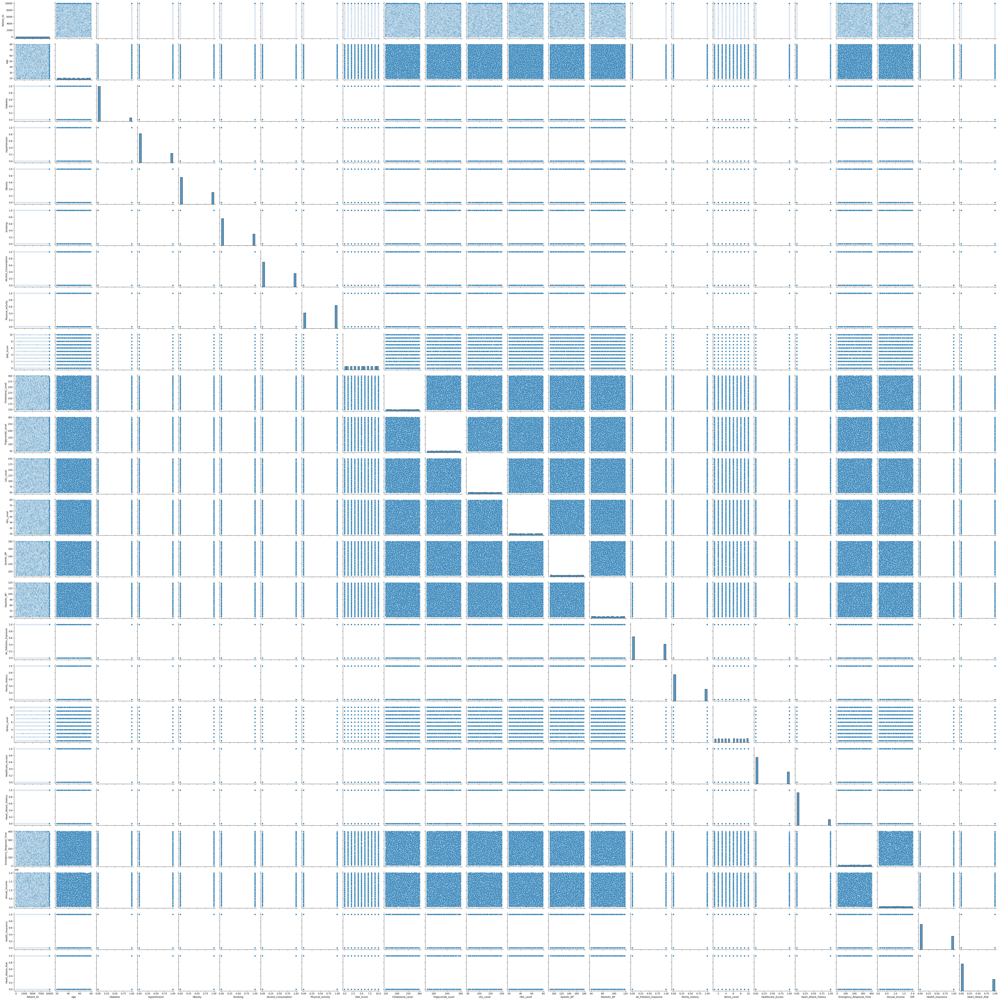

In [11]:
sns.pairplot(df)
plt.show()

In [12]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Patient_ID,10000.0,5.000500e+03,2886.895680,1.0,2500.75,5000.5,7500.25,10000.0
Age,10000.0,4.939490e+01,17.280301,20.0,35.00,49.0,64.00,79.0
Diabetes,10000.0,9.290000e-02,0.290307,0.0,0.00,0.0,0.00,1.0
Hypertension,10000.0,2.469000e-01,0.431230,0.0,0.00,0.0,0.00,1.0
Obesity,10000.0,3.037000e-01,0.459878,0.0,0.00,0.0,1.00,1.0
Smoking,10000.0,3.014000e-01,0.458889,0.0,0.00,0.0,1.00,1.0
Alcohol_Consumption,10000.0,3.528000e-01,0.477865,0.0,0.00,0.0,1.00,1.0
Physical_Activity,10000.0,5.958000e-01,0.490761,0.0,0.00,1.0,1.00,1.0
Diet_Score,10000.0,5.021700e+00,3.156394,0.0,2.00,5.0,8.00,10.0
Cholesterol_Level,10000.0,2.247530e+02,43.359172,150.0,187.00,226.0,262.00,299.0


In [13]:
df.corr(numeric_only=True)

,Patient_ID,Age,Diabetes,Hypertension,Obesity,Smoking,Alcohol_Consumption,Physical_Activity,Diet_Score,Cholesterol_Level,...,Diastolic_BP,Air_Pollution_Exposure,Family_History,Stress_Level,Healthcare_Access,Heart_Attack_History,Emergency_Response_Time,Annual_Income,Health_Insurance,Heart_Attack_Risk
Patient_ID,1.000000,0.009750,-0.013217,0.006447,-0.013353,-0.005823,-0.013774,0.011959,-0.006913,-0.000171,...,0.011993,0.003689,-0.003127,0.020750,-0.003233,-0.015761,0.009581,0.008703,0.000755,0.020455
Age,0.009750,1.000000,0.014416,0.000362,-0.017950,-0.004821,-0.000620,-0.003665,-0.013711,-0.017093,...,0.015541,0.012010,0.006995,0.027918,-0.009453,0.000817,-0.009703,-0.005499,-0.014164,0.015517
Diabetes,-0.013217,0.014416,1.000000,0.000503,0.011883,-0.003754,-0.003425,0.004564,0.004130,0.011206,...,0.000855,-0.007684,-0.005355,0.002528,-0.012591,0.005105,-0.004761,-0.013209,-0.012486,-0.009278
Hypertension,0.006447,0.000362,0.000503,1.000000,-0.021602,0.013566,-0.005855,0.019834,-0.000557,0.003471,...,0.008208,-0.021029,-0.006311,0.010283,-0.003937,-0.001627,0.014022,0.000021,0.003384,-0.001228
Obesity,-0.013353,-0.017950,0.011883,-0.021602,1.000000,-0.012488,0.000249,0.012211,0.009928,0.003271,...,-0.009770,-0.003428,0.012954,-0.024856,0.001171,0.011407,0.014716,0.000961,0.004185,-0.002004
Smoking,-0.005823,-0.004821,-0.003754,0.013566,-0.012488,1.000000,-0.027975,-0.019869,0.005772,0.008381,...,-0.009187,-0.008196,0.002702,0.011203,0.005012,0.004465,-0.005621,0.016120,0.003244,-0.012504
Alcohol_Consumption,-0.013774,-0.000620,-0.003425,-0.005855,0.000249,-0.027975,1.000000,-0.009374,0.011434,-0.010791,...,-0.002908,0.005587,0.008467,-0.007691,-0.005519,0.007556,-0.002171,-0.001635,-0.005769,-0.017283
Physical_Activity,0.011959,-0.003665,0.004564,0.019834,0.012211,-0.019869,-0.009374,1.000000,-0.001762,0.012979,...,0.009291,-0.016468,-0.011762,-0.005404,0.032163,-0.000337,0.002487,0.001603,0.000976,0.005968
Diet_Score,-0.006913,-0.013711,0.004130,-0.000557,0.009928,0.005772,0.011434,-0.001762,1.000000,0.008693,...,-0.015253,-0.001458,-0.004007,-0.002405,0.002431,0.000080,-0.003211,-0.002154,-0.004053,0.010623
Cholesterol_Level,-0.000171,-0.017093,0.011206,0.003471,0.003271,0.008381,-0.010791,0.012979,0.008693,1.000000,...,0.006900,-0.001557,0.002665,0.010012,0.018018,0.011309,-0.002897,0.006885,0.010062,-0.003054


In [14]:
# Binary values columns

binary_val = ['Diabetes', 'Hypertension', 'Obesity', 'Smoking', 'Alcohol_Consumption', 
               'Physical_Activity', 'Family_History', 'Healthcare_Access', 
               'Heart_Attack_History', 'Health_Insurance']

In [15]:
# Numerical Values Analysis

numerical_vars = ['Patient_ID','Age', 'Diet_Score', 'Cholesterol_Level', 'Triglyceride_Level', 
                  'LDL_Level', 'HDL_Level', 'Systolic_BP', 'Diastolic_BP', 
                  'Air_Pollution_Exposure', 'Stress_Level', 'Emergency_Response_Time']

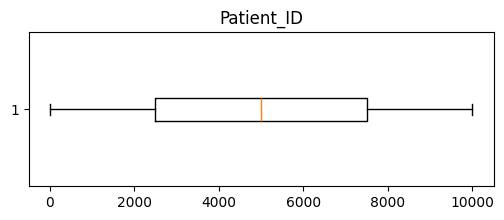

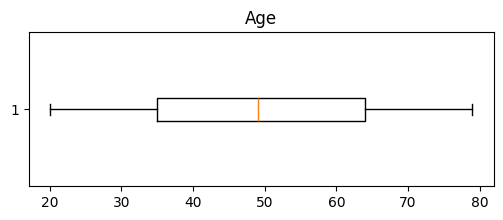

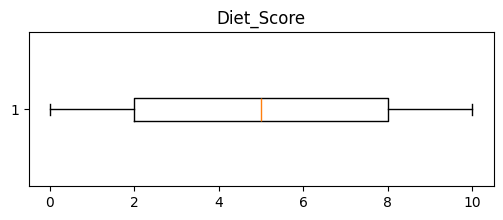

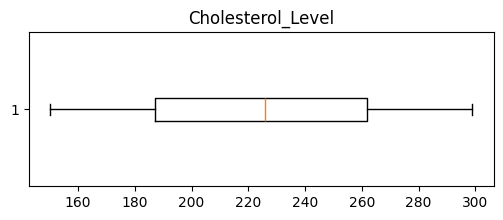

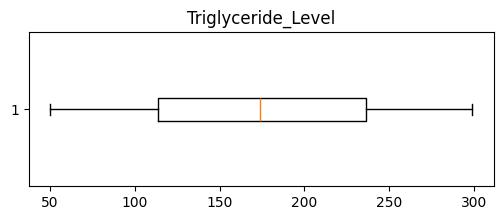

...

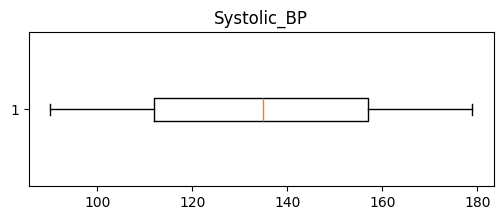

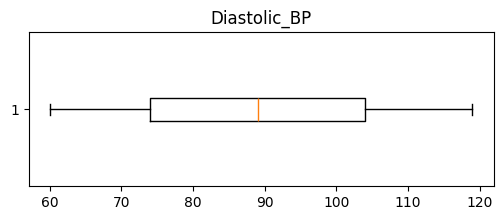

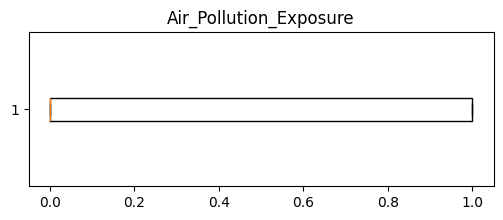

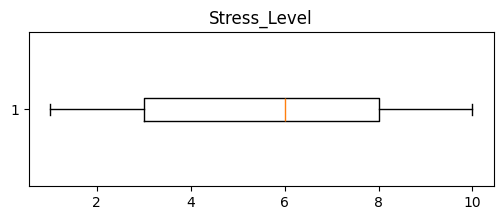

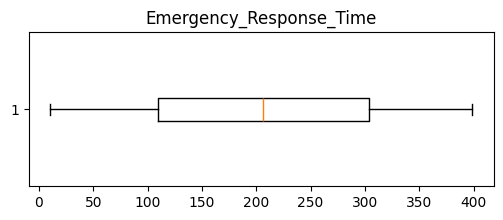

In [16]:
# To find the ouliers in numeric values columns

for i in numerical_vars:
    plt.figure(figsize=(6, 2))
    plt.boxplot(df[i], vert=False)
    plt.title(i)
    plt.show()

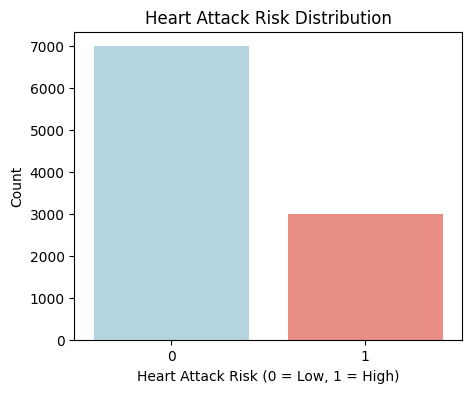

In [17]:
# Countplot to visualize heart attack risk

plt.figure(figsize=(5, 4))
sns.countplot(x="Heart_Attack_Risk", data=df, palette=["lightblue", "salmon"])
plt.title("Heart Attack Risk Distribution", fontsize=12)
plt.xlabel("Heart Attack Risk (0 = Low, 1 = High)")
plt.ylabel("Count")
plt.show()

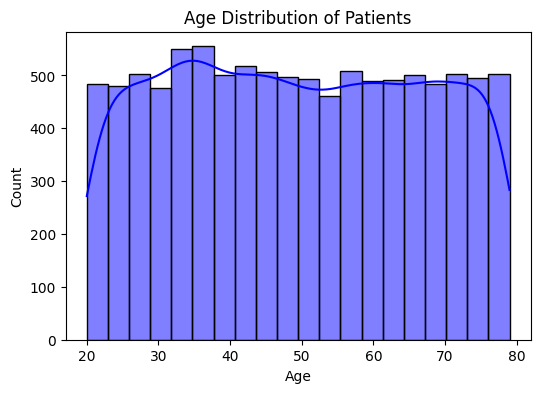

In [18]:
plt.figure(figsize=(6, 4))
sns.histplot(df['Age'], bins=20, kde=True, color='blue')
plt.title('Age Distribution of Patients')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

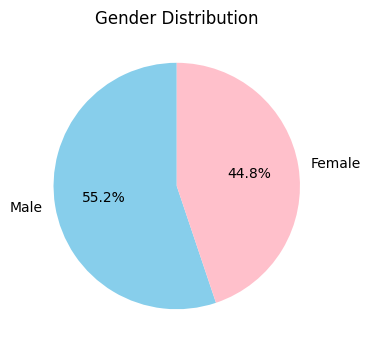

In [19]:
gender_counts = df["Gender"].value_counts()
plt.figure(figsize=(4, 4))
plt.pie(gender_counts, labels=gender_counts.index, autopct="%1.1f%%", colors=["skyblue", "pink"], startangle=90)
plt.title("Gender Distribution")
plt.show()

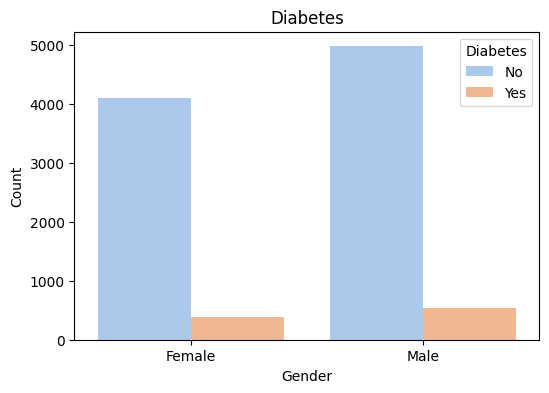

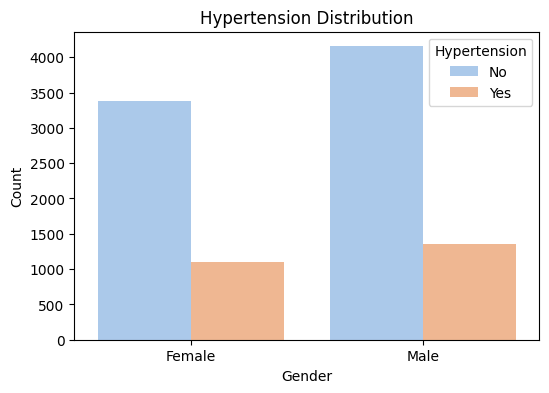

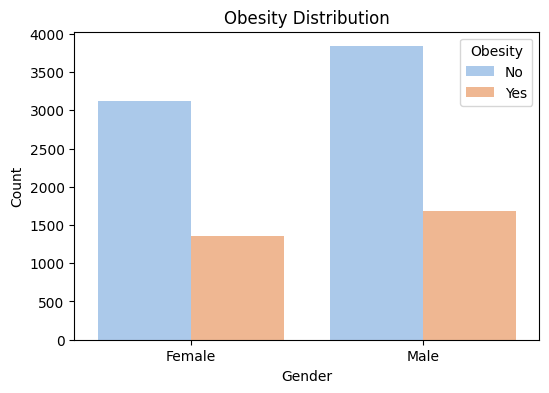

In [20]:
plt.figure(figsize=(6, 4))
sns.countplot(x='Gender', hue='Diabetes', data=df, palette='pastel')
plt.title('Diabetes')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.legend(title='Diabetes', labels=['No', 'Yes'])
plt.show()

plt.figure(figsize=(6, 4))
sns.countplot(x='Gender', hue='Hypertension', data=df, palette='pastel')
plt.title('Hypertension Distribution')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.legend(title='Hypertension', labels=['No', 'Yes'])
plt.show()

plt.figure(figsize=(6, 4))
sns.countplot(x='Gender', hue='Obesity', data=df, palette='pastel')
plt.title('Obesity Distribution')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.legend(title='Obesity', labels=['No', 'Yes'])
plt.show()

In [21]:
df["Smoking"].value_counts()

Smoking
0    6986
1    3014
Name: count, dtype: int64

In [22]:
df["Alcohol_Consumption"].value_counts()

Alcohol_Consumption
0    6472
1    3528
Name: count, dtype: int64

<Figure size 600x400 with 0 Axes>

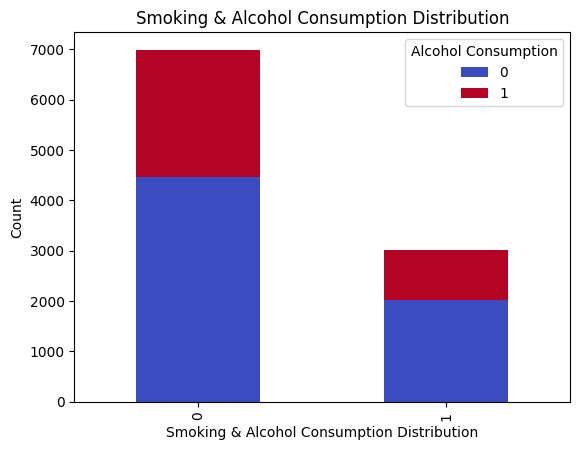

In [23]:
plt.figure(figsize=(6, 4))
smoking_alcohol = df.groupby(['Smoking', 'Alcohol_Consumption'])['Patient_ID'].count().unstack()
smoking_alcohol.plot(kind='bar', stacked=True, colormap='coolwarm')
plt.title('Smoking & Alcohol Consumption Distribution')
plt.xlabel('Smoking & Alcohol Consumption Distribution')
plt.ylabel('Count')
plt.legend(title='Alcohol Consumption')
plt.show()

In [24]:
# Checking Stress level

high_stress = df[df["Stress_Level"] >= 7]  # Filter high stress (7-10)
high_stress_count = high_stress.groupby("Gender")["Stress_Level"].count().reset_index(name="High_Stress_Count")
print(high_stress_count)

   Gender  High_Stress_Count
0  Female               1790
1    Male               2178


In [25]:
# State_Name (Top 10 states by risk)

state_risk = df.groupby('State_Name')['Heart_Attack_Risk'].mean().sort_values(ascending=False)
print("Heart Attack Risk by State:")
print(state_risk.head(10))

Heart Attack Risk by State:
State_Name
Mizoram             0.357143
Chhattisgarh        0.335840
Himachal Pradesh    0.334294
Maharashtra         0.334262
Tamil Nadu          0.329513
Kerala              0.323980
Karnataka           0.314917
Punjab              0.312312
Madhya Pradesh      0.310345
Andhra Pradesh      0.307018
Name: Heart_Attack_Risk, dtype: float64


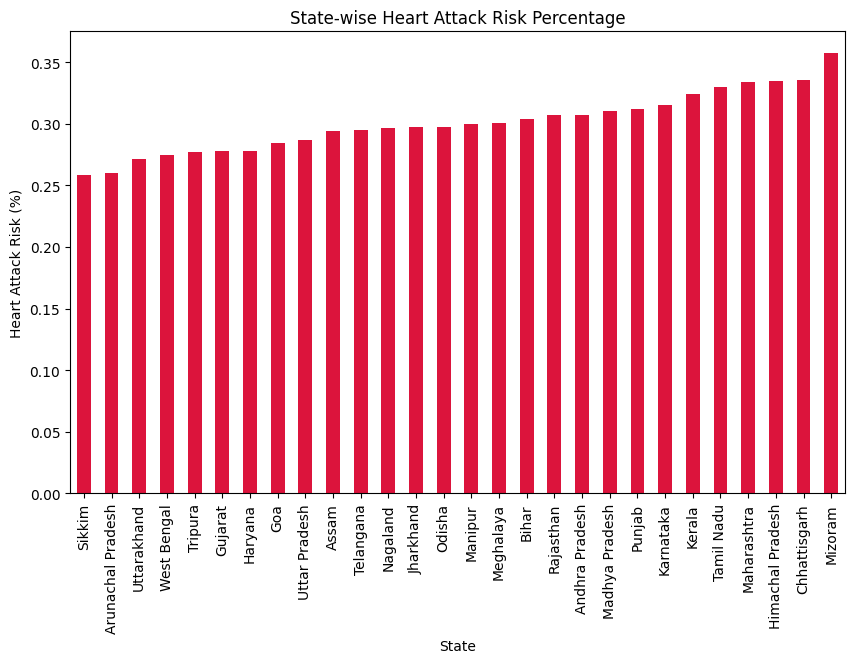

In [26]:
plt.figure(figsize=(10, 6))
state_risk = df.groupby("State_Name")["Heart_Attack_Risk"].mean().sort_values()
state_risk.plot(kind="bar", color="crimson")
plt.title("State-wise Heart Attack Risk Percentage")
plt.xlabel("State")
plt.ylabel("Heart Attack Risk (%)")
plt.xticks(rotation=90)
plt.show()

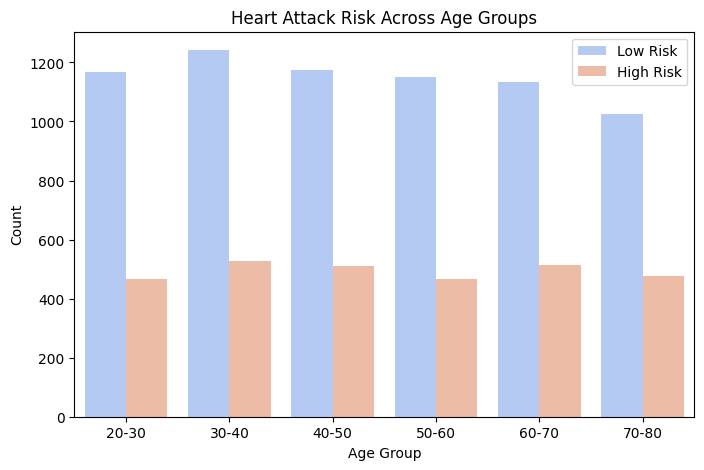

In [27]:
# Age group analysis

df["Age_Group"] = pd.cut(df["Age"], bins=[20, 30, 40, 50, 60, 70, 80], labels=["20-30", "30-40", "40-50", "50-60", "60-70", "70-80"])
plt.figure(figsize=(8, 5))
sns.countplot(x="Age_Group", hue="Heart_Attack_Risk", data=df, palette="coolwarm")
plt.title("Heart Attack Risk Across Age Groups")
plt.xlabel("Age Group")
plt.ylabel("Count")
plt.legend(["Low Risk", "High Risk"])
plt.show()

In [29]:
# Encoding

encoder = LabelEncoder()
df['Gender'] = encoder.fit_transform(df['Gender'])

In [30]:
df.sample(5)

,Patient_ID,State_Name,Age,Gender,Diabetes,Hypertension,Obesity,Smoking,Alcohol_Consumption,Physical_Activity,...,Air_Pollution_Exposure,Family_History,Stress_Level,Healthcare_Access,Heart_Attack_History,Emergency_Response_Time,Annual_Income,Health_Insurance,Heart_Attack_Risk,Age_Group
6586,6587,Jharkhand,55,0,0,1,1,0,1,0,...,1,0,5,0,0,166,1143323,0,1,50-60
5808,5809,Jharkhand,39,1,0,0,1,0,0,1,...,0,0,7,0,0,328,100799,0,1,30-40
5163,5164,Chhattisgarh,72,1,0,0,0,0,0,1,...,0,0,1,0,0,264,1361802,1,0,70-80
2523,2524,Haryana,33,0,1,0,0,0,0,0,...,1,0,1,1,0,47,1284599,1,0,30-40
5249,5250,Kerala,69,0,0,1,0,0,0,1,...,0,1,4,0,0,233,1759638,1,0,60-70


In [31]:
df.drop(["Age_Group","State_Name","Patient_ID","Annual_Income"], axis=1, inplace=True)

In [32]:
df.sample(5)

,Age,Gender,Diabetes,Hypertension,Obesity,Smoking,Alcohol_Consumption,Physical_Activity,Diet_Score,Cholesterol_Level,...,Systolic_BP,Diastolic_BP,Air_Pollution_Exposure,Family_History,Stress_Level,Healthcare_Access,Heart_Attack_History,Emergency_Response_Time,Health_Insurance,Heart_Attack_Risk
9528,34,0,0,0,1,0,1,0,10,277,...,97,99,0,1,7,1,0,322,1,1
4450,29,0,0,0,1,1,0,0,2,254,...,153,60,0,0,10,1,0,240,0,0
8006,58,1,0,0,0,1,1,0,7,286,...,133,79,0,0,9,0,0,330,0,0
9723,70,1,0,0,1,1,0,0,6,190,...,107,61,0,0,7,1,0,61,0,0
5095,35,1,0,0,1,0,0,0,5,281,...,121,100,0,0,1,1,0,50,1,0


In [33]:
X = df.drop(["Heart_Attack_Risk"], axis = 1)
y = df["Heart_Attack_Risk"]

In [132]:
X_tr, x_te, y_tr, y_te = train_test_split(X, y, train_size=0.3, random_state=43,stratify=y)

In [133]:
print(X_tr.shape)
print(x_te.shape)

(3000, 22)
(7000, 22)


In [134]:
scaler = StandardScaler()

In [135]:
X_tr = scaler.fit_transform(X_tr)

In [136]:
x_te = scaler.transform(x_te)

In [137]:
model = LogisticRegression()

In [138]:
model.fit(X_tr, y_tr)

LogisticRegression()

In [139]:
training_score = model.score(X_tr, y_tr)

In [140]:
training_score

0.6993333333333334

In [141]:
y_pr = model.predict(x_te)

In [142]:
testing_score = accuracy_score(y_te,y_pr)

In [143]:
testing_score

0.6992857142857143

In [144]:
accuracy_score(y_te, y_pr)

0.6992857142857143

In [145]:
print(classification_report(y_te, y_pr))

              precision    recall  f1-score   support

           0       0.70      1.00      0.82      4895
           1       0.00      0.00      0.00      2105

    accuracy                           0.70      7000
   macro avg       0.35      0.50      0.41      7000
weighted avg       0.49      0.70      0.58      7000



In [153]:
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

svm = SVC(kernel = 'rbf')

In [154]:
svm.fit(X_tr,y_tr)

SVC()

In [155]:
y_pr2 = svm.predict(x_te)

In [156]:
print('accuracy score', accuracy_score(y_te,y_pr2))
print('confusion matrix', confusion_matrix(y_te, y_pr2))

accuracy score 0.6988571428571428
confusion matrix [[4892    3]
 [2105    0]]


In [147]:
knc = KNeighborsClassifier(n_neighbors=20)

In [148]:
knc.fit(X_tr,y_tr)

KNeighborsClassifier(n_neighbors=20)

In [149]:
knc.score(X_tr,y_tr)

0.704

In [150]:
y_pr3 = model.predict(x_te)

In [151]:
accuracy_score(y_te, y_pr3)

0.6992857142857143